In [2]:
import pandas as pd


In [3]:
df=pd.read_csv("mnist.csv")

In [4]:
df.sample(2)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
9431,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
31051,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [5]:
df.sample(2)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
1390,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4898,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [6]:
import matplotlib.pyplot as plt

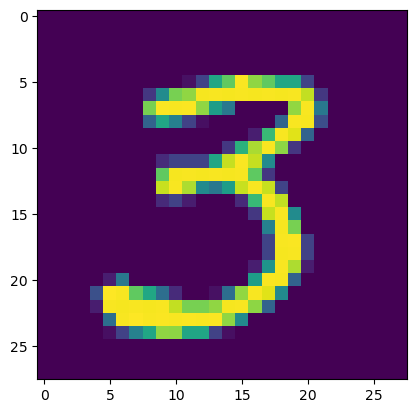

In [7]:
plt.imshow(df.iloc[28600 ,1:].values.reshape(28,28))

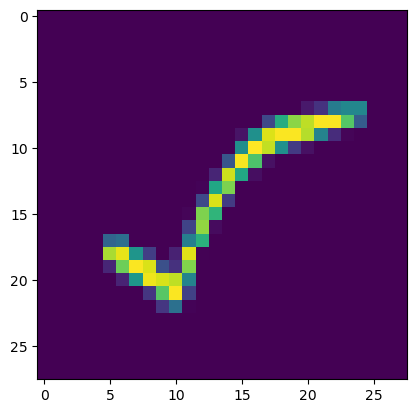

In [8]:
plt.imshow(df.iloc[7097,1:].values.reshape(28,28))

In [9]:
x=df.iloc[:,1:]
y=df.iloc[:,0]

In [10]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)


In [11]:
x_train.shape

(33600, 784)

In [12]:
from sklearn.neighbors import KNeighborsClassifier

In [13]:
kn=KNeighborsClassifier()

In [15]:
kn.fit(x_train,y_train)

KNeighborsClassifier()

In [16]:
import time
start=time.time()
y_pred=kn.predict(x_test)
print(time.time()-start)

31.88082265853882


In [17]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9648809523809524

In [38]:
import numpy as np
from PIL import Image
import cv2
import os

IMG_DIR = 'C:/Users/raj/0-try/project1/pro'

for img in os.listdir(IMG_DIR):
    img_path = os.path.join(IMG_DIR, img)
    img_array = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

    if img_array is None:
        print(f"Warning: Failed to read {img_path}. Skipping this file.")
        continue

    img_pil = Image.fromarray(img_array)
    img_28x28 = np.array(img_pil.resize((28, 28)))

    img_array = img_28x28.flatten()

    img_array = img_array.reshape(-1, 1).T


    with open('train.csv', 'ab') as f:
        np.savetxt(f, img_array, delimiter=",")


In [39]:
k=pd.DataFrame(img_array)

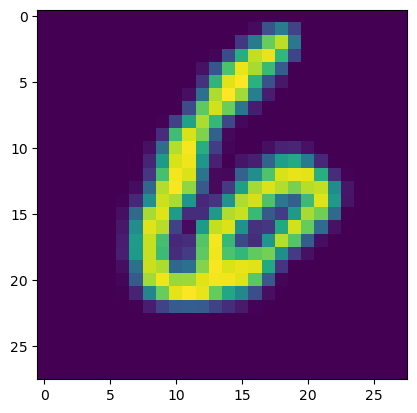

In [40]:
plt.imshow(k.values.reshape(28,28))

In [41]:
k.shape

(1, 784)

In [42]:
m=kn.predict(k)

C:\Users\raj\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but KNeighborsClassifier was fitted with feature names
  warnings.warn(


In [43]:
print(m)

[6]


In [44]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [45]:
x_train_trf2=scaler.fit_transform(x_train)
x_test_trf2=scaler.fit_transform(x_test)
x_train_trf2=pd.DataFrame(x_train)

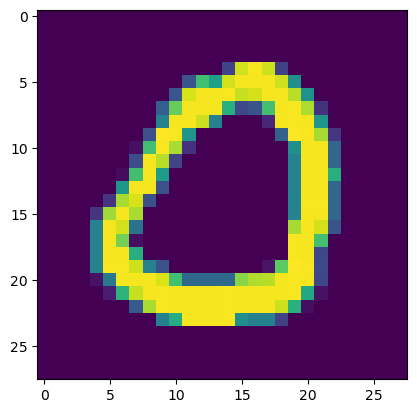

In [66]:
import seaborn as sns
plt.imshow(x_train_trf.iloc[860,0:].values.reshape(28,28))

In [46]:
type(df)

pandas.core.frame.DataFrame

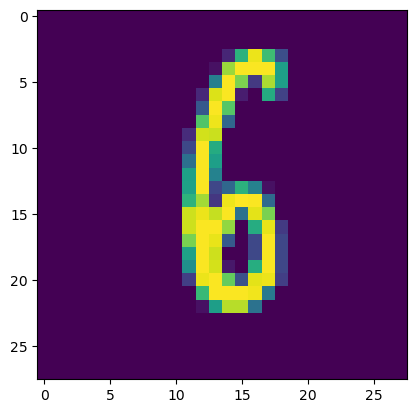

In [54]:
plt.imshow(x_train.iloc[7097,0:].values.reshape(28,28))

In [46]:
x_train

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
34941,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24433,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24432,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8832,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30291,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6265,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
860,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [47]:
from sklearn.decomposition import PCA
pca=PCA(n_components=2)

In [48]:
x_train_trf12=pca.fit_transform(x_train_trf2)
x_test_trf12=pca.transform(x_test_trf2)

C:\Users\raj\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning: X does not have valid feature names, but PCA was fitted with feature names
  warnings.warn(


In [49]:
import plotly.express as px


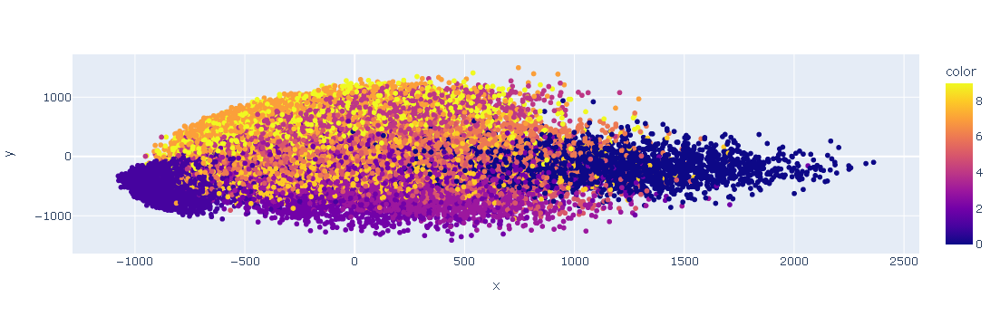

In [50]:
fig=px.scatter(df,x=x_train_trf12[:,0],y=x_train_trf12[:,1],
              color=y_train,
                color_discrete_sequence=px.colors.qualitative.G10)
fig.show()

In [51]:
import plotly.express as px

In [52]:
from sklearn.decomposition import PCA
pca=PCA(n_components=3)

In [53]:
x_train_trf13=pca.fit_transform(x_train_trf2)
x_test_trf13=pca.transform(x_test_trf2)

C:\Users\raj\anaconda3\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but PCA was fitted with feature names



In [54]:
x_train_trf13

array([[-226.60903755,  305.87709456,  417.06382182],
       [  38.33798834, -461.08131394,  100.45820711],
       [-305.48773701, -351.65101242, -961.2417754 ],
       ...,
       [ -27.99770079,  596.07714564,  606.33936911],
       [ 233.96787255,   18.6369615 , -148.32550094],
       [1096.5073822 , -254.70915676, -560.21169924]])

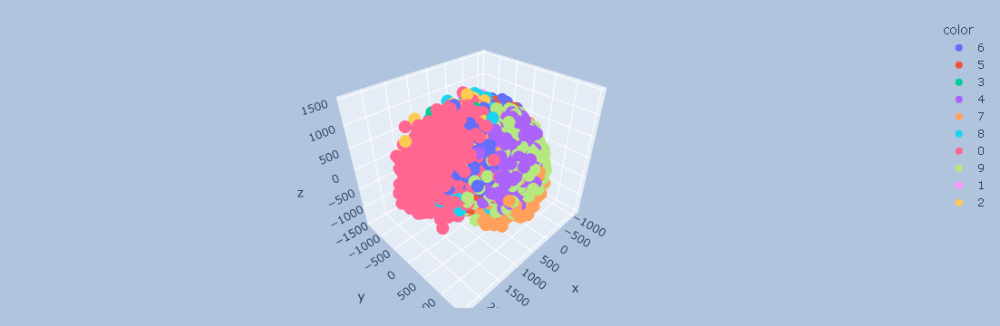

In [55]:
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=x_train_trf13[:,0], y=x_train_trf13[:,1], z=x_train_trf13[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=30, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()

In [56]:
x_train_trf2

,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
34941,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24433,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
24432,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8832,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
30291,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6265,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
11284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
860,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
